In [1]:
import pandas as pd
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D 
from matplotlib.patches import Patch
import seaborn as sns
import matplotlib.colors as mcolors
import heapq
from scipy.ndimage import gaussian_filter1d,binary_closing, binary_opening
from skimage.morphology import skeletonize
from skan import Skeleton, summarize
from scipy.ndimage import uniform_filter1d
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from scipy.ndimage import label
from scipy.ndimage import grey_opening,grey_closing
from scipy.signal import butter, filtfilt   
from matplotlib.gridspec import GridSpecFromSubplotSpec
import AnalysisMethod as am
import argparse
from scipy.cluster import hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import seaborn as sns
import glob
import numpy as np
import matplotlib.pyplot as plt
import sys
from tqdm import tqdm
import matplotlib as mpl
import os
from collections import Counter
from scipy.io import loadmat
import cv2
import imageio
from io import BytesIO
from PIL import Image
from multiprocessing import Pool
from matplotlib.collections import LineCollection
import warnings
warnings.filterwarnings('ignore')
from tifffile import imread
mpl.rcParams['figure.figsize'] = (6,6)
mpl.rcParams['figure.dpi'] = 96
mpl.rcParams['font.size'] = 14
mpl.rcParams['savefig.bbox'] = 'tight'

In [217]:
def PlotPmdCluster(w_p2m,idx_pmd,idx_m1,bound_pmd,bound_m1,link,aff,vmin,vmax,threshold,xlabel,ylabel,cmap,level):
    fig = plt.figure(figsize=(7, 6))
    ax = plt.subplot(1,1,1)
    ax.xaxis.set_ticks_position('none')  # 不显示x轴的刻度
    ax.yaxis.set_ticks_position('none')  # 不显示y轴的刻度
    ax.set_xticks([])  # 移除x轴的刻度标记
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    # plt.title(title)
    gs00 = GridSpecFromSubplotSpec(1, 2, subplot_spec=ax.get_subplotspec(), wspace=0.02, hspace=0.02, width_ratios=[3., 0.5])
    ax0 = fig.add_subplot(gs00[0, 0])
    ax1 = fig.add_subplot(gs00[0, 1])
    # ax2 = fig.add_subplot(gs00[0, 0])
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None,linkage=link, affinity=aff)
    model = model.fit(w_p2m)
    am.plot_dendrogram(model, truncate_mode="level", p=level, \
                    no_labels=True, orientation='right', ax=ax1,color_threshold=threshold)
    # ax1.set_xlim([0.5,2])
    ax1.xaxis.set_ticks_position('none')  # 不显示x轴的刻度
    ax1.yaxis.set_ticks_position('none')  # 不显示y轴的刻度
    ax1.set_xticks([])  # 移除x轴的刻度标记
    ax1.set_yticks([])
    ax1.invert_yaxis()
    for spine in ax1.spines.values():
        spine.set_visible(False)
    ax_list=list(np.linspace(0,w_p2m.shape[0],24,dtype=int))
    X_sort = w_p2m[idx_pmd][:,idx_m1]
    ax0=sns.heatmap(X_sort, ax=ax0, cmap=cmap, vmin=vmin, vmax=vmax,cbar=False)
    cbar_ax = fig.add_axes([-0.02, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    cbar=fig.colorbar(ax0.collections[0], cax=cbar_ax)
    cbar.ax.yaxis.set_ticks_position('left')  # 将刻度移动到左边
    cbar.ax.yaxis.set_label_position('left')
    ax0.set_xticks(ax_list, ax_list,fontsize=10)
    ax0.set_yticks(ax_list, ax_list,fontsize=10)
    # ax0.invert_yaxis()
    ax0.set_xlabel(xlabel,fontsize=16)
    ax0.set_ylabel(ylabel,fontsize=16)
    boundary = 0
    idx_bound=np.zeros(len(bound_pmd)+1)
    # print(boundaries_y)
    for i in range(len(bound_pmd)-1):
        boundary = bound_pmd[i]
        idx_bound[i+1]=boundary
        # print(boundary)
        ax0.axhline(y=boundary, color='white', linestyle='--')
    idx_bound[-1]=400
    boundary = 0
    for i in range(len(bound_m1)-1):
        boundary = bound_m1[i]  
        # print(boundary)
        ax0.axvline(x=boundary, color='white', linestyle='--')
    return idx_bound.astype(int),fig

In [532]:
from matplotlib.colors import LinearSegmentedColormap
def calcium_heatmap(calcium_intensity, neuron_ids, show_id_stride=20, show_vol_stride=20, heatmap_range=(None,0.5),fig_size=None, font_size=90, font_color='black',smooth_kernel=10,vlines=None):
    num_neurons, num_vols = calcium_intensity.shape
    # num_vols = num_vols//3
    DRR0 = calcium_intensity

    if smooth_kernel:
        for i,k in enumerate(DRR0):
            DRR0[i] = cv2.blur(k,(1,smooth_kernel))[:,0]
            # DRR0 = savgol_filter(DRR0, window_length=5, polyorder=2)
    # 绘制热力图
    zscore_positions = [-1.5, -0.75, 0, 0.75, 1.5]
    colors = ['#000080', '#6495ED', '#FFFFFF', '#FFA07A', '#8B0000']
    
    # 从 heatmap_range 中取出 vmin, vmax
    vmin, vmax = heatmap_range
    
    # 避免 vmin 和 vmax 为空（None）
    if vmin is None:
        vmin = np.min(DRR0)
    if vmax is None:
        vmax = np.max(DRR0)
    
    # 将原始位置归一化映射到 [0, 1]
    zscore_norm = [(z + 1.5) / 3.0 for z in zscore_positions]
    
    # 构建 colormap
    custom_cmap = LinearSegmentedColormap.from_list('custom_heatmap', list(zip(zscore_norm, colors)))
    plt.figure(figsize=fig_size)
    heatmap=sns.heatmap(DRR0, cmap='jet', vmin=heatmap_range[0], vmax=heatmap_range[1], xticklabels=np.arange(num_vols)[::show_vol_stride], yticklabels=neuron_ids[::show_id_stride],cbar=True,)
    colorbar = heatmap.collections[0].colorbar
    colorbar.ax.tick_params(labelsize=font_size)  # 设置 colorbar 字体大小

    #-------------------------
    # 假设要添加的文本字符串为 'Vertical Text'
    text_str = 'ΔR/R0'

    # 获取颜色条的轴对象
    colorbar_ax = colorbar.ax

    # 设置颜色条轴的标签大小
    # font_size = 20
    colorbar_ax.tick_params(labelsize=font_size)

    # 添加垂直文本
    x_pos = 3.1  # 控制文本的水平位置，可以根据需要调整
    y_pos = 0.5  # 控制文本的垂直位置
    rotation = 90  # 文本旋转角度

    colorbar_ax.text(x_pos, y_pos, text_str, rotation=rotation,
                    transform=colorbar_ax.transAxes,
                    verticalalignment='center', horizontalalignment='center', fontsize=font_size)
    #-------------------------
    # x_sticks = np.array([ 244,  668, 1012, 1085, 1139, 1194, 1296, 1364, 1404, 1438]) # 06
    # for x in x_sticks:
    #     plt.axvline(x=x, color='white', linestyle='--', linewidth=4)  # Adjust color and linestyle as needed

    plt.yticks(ticks=np.arange(0, num_neurons, show_id_stride), labels=neuron_ids[::show_id_stride],fontsize=font_size, color=font_color)
    plt.xticks(ticks=np.arange(0, num_vols, show_vol_stride), labels=np.arange(num_vols)[::show_vol_stride],fontsize=font_size, rotation=45, color=font_color)
    # plt.xticks(ticks=np.arange(0, num_vols, show_vol_stride), labels=np.arange(0,1300,100),fontsize=font_size, rotation=45, color=font_color)
    # plt.title('Calcium activity traces (ΔR/R0) Heatmap',fontsize=font_size,)
    
    # 总时间（单位：秒）
    time_per_volume = 0.3  # 每个 volume 对应的时间
    total_time = num_vols * time_per_volume
    
    # 以 100 秒为间隔设置时间刻度
    time_ticks = np.arange(0, total_time + 1, 100)  # +1 确保覆盖尾部
    volume_ticks = (time_ticks / time_per_volume).astype(int)
    
    plt.xticks(ticks=volume_ticks, labels=time_ticks.astype(int), fontsize=font_size, rotation=0, color=font_color)
    plt.xlabel('Time (s)', fontsize=font_size, color=font_color)

    plt.ylabel('Neurons',fontsize=font_size,color=font_color)
    # plt.axis('off')
    # plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # 设置y轴的刻度位置，使其从顶部开始，因为神经元通常从顶部向下绘制
    plt.gca().invert_yaxis()
        # 如果提供了竖线位置，绘制竖线
    if vlines is not None:
        for x in vlines:
            plt.axvline(x=x, color='white', linestyle='--', linewidth=4)
    # plt.show()
    if smooth_kernel:
        plt.savefig(f'{signal_save_path}/cluster_calcium_heatmap(smooth_{smooth_kernel}).png', transparent=False,dpi=100)
    else:
        plt.savefig(f'{signal_save_path}/cluster_calcium_heatmap.png', transparent=False,dpi=100)


In [219]:
def draw_calcium_curve(calcium_intensity, smooth_kernel=None, save=True,fig_size=None, scale=1):

    plt.figure(figsize=fig_size)
    num_neurons, num_timepoints = calcium_intensity.shape
    colors = ['orangered', 'blue', 'limegreen', 'purple', 'gold', 'cyan', 'magenta', 'coral', 'skyblue', 'orange']
    import cv2
    for i in range(calcium_intensity.shape[0]):
        color = colors[i % len(colors)]  # 循环使用颜色列表
        if smooth_kernel:
            smooth_line_data = cv2.blur(calcium_intensity[i], (100, 1))*scale
        else:
            line_data = calcium_intensity[i]*scale
        smooth_line_data = cv2.blur(calcium_intensity[i], (1, 7))*scale
        # smooth_line_data = calcium_intensity[i]*scale
        plt.plot(smooth_line_data + i, color=color, linestyle='-', label='A' if i == 0 else "",linewidth=1)  # 只显示第一个标签
        plt.scatter(y=line_data+i,x=np.arange(line_data.shape[0]),color=color, linestyle='-', label='A' if i == 0 else "",s=1)  # 只显示第一个标签
        if i in bound:
            plt.axhline(y=i-0.2, color='k', linestyle='dashdot', linewidth=4, c='r')  # 在y轴索引位置画一条虚线

    plt.xlabel("Time point",fontsize=20)  # X轴标签
    plt.ylabel("Intensity",fontsize=20)  # Y轴标签
    # 设置 y 轴范围
    plt.ylim(bottom=0-1, top=num_neurons+1)  # 设置 y 轴的最小值为 0，最大值为 num_neurons

    # 每隔 5 个单位标注一个 y ticks
    y_ticks = np.arange(0, num_neurons + 1, 1)  # 生成从 0 到 num_neurons 的刻度，每隔 5 个单位
    plt.yticks(y_ticks,fontsize=20)  # 设置 y 轴刻度
    x_ticks = np.arange(0, num_timepoints + 1, 200)  # 生成从 0 到 num_neurons 的刻度，每隔 5 个单位
    plt.xticks(x_ticks,fontsize=20,rotation=45)  # 设置 y 轴刻度
    # plt.show()
    plt.tight_layout()
    if save:
        if smooth_kernel:
            plt.savefig(f'{signal_save_path}/cluster_calcium_curve(smooth_{smooth_kernel}).png')
        else:
            plt.savefig(f'{signal_save_path}/cluster_calcium_curve.png')

In [220]:
def extract_laser_segments():
    """
    根据激光控制信号（s_data）提取激光照射期间及其前后 margin 倍的时间窗口。
    该函数使用的是视频信号时间戳
    
    参数：
        t_stage: 载物台时间戳数组（一维 numpy array，单位 ms）
        t_c: 相机时间戳数组（一维 numpy array，单位 ms）
        s_data: 激光控制信号的 dataframe，列0为时间戳，列1为事件类型（2：on，3：off）

    返回：
        df_whole:追踪全程数据
        df_nt:激光照射时间内数据
    """
    # s_start = s_data[s_data[1] == 2].index
    # s_stop = s_data[s_data[1] == 3].index
    # 
    # if s_stop.empty:
    #     s_s = [len(s_data[1])]
    # else:
    #     s_s = []
    #     for m in s_start:
    #         data = (s_stop >= m)
    #         s_s.append(s_stop[data == 1][0])
    # 
    #     # 截取片段
    # t_l = int(round((s_data[0][s_start[i] + 1 : s_s[i] - 1]).diff().sum(skipna=True) / (s_s[i] - s_start[i] - 2)))
    # t = s_data[0].values
    # t_frame = np.concatenate([[t[s_start[i]] - t_l *2, t[s_start[i]] - t_l], t[s_start[i]:s_s[i]]])
    # t_start = s_data[0][s_start[i]] - t_l *2
    # t_stop = s_data[0][s_s[i] - 1] + t_l
    
    # 截取激光照射段数据
    f_start = np.searchsorted(t_c, t_start) - 1
    start_index = np.where(data_keys == f_start)[0][0]
    f_stop = np.searchsorted(t_c, t_stop)
    if f_stop > data_keys[-1]:
        f_stop = np.int64(data_keys[-1])
    stop_index = np.where(data_keys == f_stop)[0][0]
    x_c = x_s[start_index:stop_index]
    y_c = y_s[start_index:stop_index]
    angle_cut = angle_m[start_index:stop_index]
    std_c = std[start_index:stop_index]
        # 绘图
    plt.figure(figsize=(20, 10)) 
    plt.scatter(x_c[0],y_c[0], c='g', marker='^', s=50, label='Start Point')
    plt.scatter(x_c[angle_cut <= 100], y_c[angle_cut <= 100], c='b', label='Angle <= 120°', s=1)
    plt.scatter(x_c[angle_cut > 100], y_c[angle_cut > 100], c='r', label='Angle > 120°', s=1)
    plt.axis('equal')
    # plt.plot(angle_cut)
    plt.show()
    
        # 显示卷曲行为的frames
    plt.figure(figsize=(20,5))
    pattern_sequence = np.zeros(len(t_c))
    pattern_sequence[circular_frames] = 1
    # plt.plot(pattern_sequence)
    # pattern_sequence = np.zeros(len(t_c))
    pattern_sequence[branching_frames] = 1
    plt.plot(pattern_sequence)
    
    pattern_sequence = np.zeros(len(t_c))
    pattern_sequence[ano_merged] = 1
    # pattern_sequence[post_f] = 1
    plt.plot(pattern_sequence)
    plt.legend()
   
       # 显示激光照射期间的行为和食物变化
    
    i_choose = np.uint32(choose_frame)
    i_choose = i_choose[(i_choose >= start_index) & (i_choose < stop_index)]
    t_f = t_c[i_choose] / 1000
    i_m = np.uint32(merged)
    i_m = i_m[(i_m >= start_index) & (i_m < stop_index)]
    t_m = t_c[i_m] / 1000
    plt.figure(figsize=(20,10))
    plt.subplot(2,1,1)
    pattern_sequence = np.zeros(len(t_c))
    pattern_sequence[circular_frames] = 1
    # plt.scatter(t_cut, pattern_sequence[f_start:f_stop], s=1)
    plt.plot(pattern_sequence[f_start:f_stop])
    pattern_sequence = np.zeros(len(t_c))
    pattern_sequence[branching_frames] = 1
    # plt.scatter(t_cut, pattern_sequence[f_start:f_stop], s=1)
    plt.plot(pattern_sequence[f_start:f_stop])
    plt.subplot(2,1,2)
    for xv in t_m:
        plt.axvspan(xv - 0.01, xv + 0.01, color='gray', alpha=0.1)
    # plt.scatter(t_cut, std_c, s=1)
    # plt.scatter(t_cut, angle_cut > 120, s=1)
    i_index = np.searchsorted(data_keys, i_choose)
    s_c = std[i_index]
    f_c = angle_m[i_index] > 120
    plt.scatter(t_f, s_c, s=1)
    plt.scatter(t_f[f_c], s_c[f_c], s=1)
    # plt.scatter(t_f ,angle_cut[i_choose] > 120, s=1)
    print(t_f[-1])
    print(start_index,stop_index)
    

In [221]:
def process_trajectory(shelter, frate,frame_lv=0.2, frame_as=0.5,rd_criteria=2000,smooth_window=0.5,track_jump=1,):
    """
    处理单条轨迹数据，计算线速度和角速度等。
    参数:
    shelter (list of numpy.ndarray): 轨迹数据列表，每个元素是一个 numpy 数组。
    frate (float): 帧率。
    rd_criteria (float): 用于判断的阈值。
    返回:
    list of numpy.ndarray: 处理后的轨迹数据列表。
    """
    df_slide = shelter.copy()
    smooth_window=int(smooth_window*frate)
    df_slide['X'] = df_slide['X'].rolling(window=smooth_window, center=True).mean()
    df_slide['Y'] = df_slide['Y'].rolling(window=smooth_window, center=True).mean()
    # ======================================================线速度计算===========
    data_num_lv = int(frame_lv * frate/track_jump) + 1  # 处理单个线速度所需的数据数量
    half_num_lv=data_num_lv//2
    data_num_lv=half_num_lv*2
    trajectory_0 = df_slide[['X','Y','Track_Time']].values      # 提取x,y坐标和时间戳
    trajectory_1 = (trajectory_0.copy()).astype('float')                            # 转float数据类型
    x = trajectory_1[:,0]
    y = trajectory_1[:,1]
    delta_x = (x[data_num_lv:]-x[:len(x)-data_num_lv])                       # 得到减去头尾数据点的delta_x和delta_y
    delta_y = (y[data_num_lv:]-y[:len(y)-data_num_lv])
    time_step = trajectory_1[:,2]
    time_step_lv = time_step[data_num_lv:]-time_step[:len(time_step)-data_num_lv]
    velocity_bef = np.dstack((delta_x/time_step_lv,delta_y/time_step_lv))[0]      # 使用dstack函数合并x,y方向计算的速度为一个矩阵
    speed_bef = np.linalg.norm(velocity_bef, axis = 1).reshape(-1,1)        #求模，得到速率
    nan_bin_vec = np.full((half_num_lv,2),np.nan)
    nan_bin_spd = np.full((half_num_lv,1),np.nan)
    velocity = np.vstack((nan_bin_vec, velocity_bef, nan_bin_vec))                  # 速度向量
    speed = np.vstack((nan_bin_spd, speed_bef, nan_bin_spd))                        # 速率向量
    velocity_angle = np.array([acal(v) if not np.isnan(v[0]) and not np.isnan(v[1]) else np.nan for v in velocity])
    
    df_idx = df_slide[['X','Y','Track_Time']].copy()      
    df_idx['speed'] = pd.Series(speed[:,0],index = df_idx.index)                    # 将speed和velocity加入dataframe
    df_idx['x_velocity'] = pd.Series(velocity[:,0],index = df_idx.index)
    df_idx['y_velocity'] = pd.Series(velocity[:,1],index = df_idx.index)
    df_idx['speed_smoothed'] = df_idx['speed'].rolling(window=smooth_window*3, center=True, min_periods=1).mean()
    df_idx['velocity_angle'] = pd.Series(velocity_angle, index=df_idx.index)
    # ======================================================角速度计算===========
    
    data_num_as = int(frame_as * frate/track_jump) + 1  # 处理单个角速度所需的数据数量
    hafl_num_as=data_num_as//2
    data_num_as=hafl_num_as*2
    time_step_as = time_step[data_num_as:]-time_step[:len(time_step)-data_num_as]
    trajectory_0 = df_slide[['X','Y','Track_Time']].values      # 提取x,y坐标和时间戳
    trajectory_1 = (trajectory_0.copy()).astype('float')                            # 转float数据类型
    x = trajectory_1[:,0]
    y = trajectory_1[:,1]
    delta_x = (x[data_num_as:]-x[:len(x)-data_num_as])                                     # 得到减去头尾数据点的delta_x和delta_y
    delta_y = (y[data_num_as:]-y[:len(y)-data_num_as])
    time_step = trajectory_1[:,2]  
    time_step_vec = time_step[data_num_as:]-time_step[:len(time_step)-data_num_as]        # 得到减去头尾数据点的对应delta-x和delta-y的时间
    velocity_bef = np.dstack((delta_x/time_step_vec,delta_y/time_step_vec))[0]             # 使用dstack函数合并x,y方向计算的速度为一个矩阵
    speed_bef = np.linalg.norm(velocity_bef, axis = 1).reshape(-1,1)
    nan_bin_vec = np.full((hafl_num_as,2),np.nan)
    nan_bin_spd = np.full((hafl_num_as,1),np.nan)
    velocity = np.vstack((nan_bin_vec, velocity_bef, nan_bin_vec))
    speed = np.vstack((nan_bin_spd, speed_bef, nan_bin_spd))[:,0]
    time_step_vector = np.vstack((nan_bin_spd, time_step_vec.reshape(-1,1), nan_bin_spd))[:,0]
    df_speed_cal = pd.DataFrame(speed,columns = ['speed'])
    idx_vec = df_speed_cal.index                                        # 生成索引列表时先掐头去尾再取非零值
    df_washed_speed = df_speed_cal[data_num_as//2:len(idx_vec)-data_num_as//2]
    idx_nz_vec = df_washed_speed[df_washed_speed['speed']!=0].index     # 索引是相对于总长度，但是这个列表中直接去掉了头尾速度为nan的和速率为0的点的索引
    df_speed_cal['agl_velocity'] = pd.Series([np.nan]*len(idx_vec))
    

    for i in range(data_num_as//2,len(idx_nz_vec)-data_num_as//2):
        n = data_num_as//2
        agl_i = acal(velocity[idx_nz_vec[i-n]],velocity[idx_nz_vec[i+n]]) 
        time_end= time_step[idx_nz_vec[i+n]]
        time_start = time_step[idx_nz_vec[i-n]]
        delta_t_i = time_end-time_start
#         print("timestamp", time_start, time_start)
#         print('角度计算时间间隔：',delta_t_i)
        agl_vel_i = agl_i/delta_t_i

        if not np.isnan(agl_vel_i):
            df_speed_cal.loc[idx_nz_vec[i], 'agl_velocity'] = agl_vel_i
        else:
            df_speed_cal.loc[idx_nz_vec[i], 'agl_velocity'] = 0 
    # 将angular_velocity和angular_speed加入dataframe(df_idx)
    df_idx['agl_velocity'] = pd.Series(df_speed_cal['agl_velocity'].values,index = df_idx.index)
    df_idx.loc[:,'x_velocity_agl'] = velocity[:,0]
    df_idx.loc[:,'y_velocity_agl'] = velocity[:,1]
    df_idx.loc[df_idx.speed == 0, 'agl_velocity'] = 0                 # 将speed为0的点角速度设为0
    df_idx['agl_speed'] = np.abs(df_idx['agl_velocity'])
    agl_speed_sbs= df_idx['agl_speed'].abs()
    df_idx['agl_speed_smoothed'] = (
    agl_speed_sbs
    .rolling(window=smooth_window*5, center=True, min_periods=1)
    .mean()
    )
    # ======================================================状态划分===========
    df_idx['roaming'] = (df_idx['agl_speed_smoothed'] / df_idx['speed_smoothed']) < rd_criteria
    # 将布尔值转换为整数（True -> 1, False -> 0）
    df_idx['roaming'] = df_idx['roaming'].astype(int)
    
    
    
    # # 处理 NaN 值
    # shelter[:int(framesolvelv / 2), 4:6] = np.nan
    # shelter[-int(framesolvelv / 2):, 4:6] = np.nan
    # shelter[:framesolveas - 1, 6:8] = np.nan
    # shelter[-framesolveas + 2:, 6:8] = np.nan

    return df_idx

In [222]:
def acal(vec1, vec2=[1,0]):
    """
    计算两个向量之间的夹角，并根据条件调整符号。
    参数:
    vec1 (numpy.ndarray): 第一个向量，形状为 (2,)。
    vec2 (numpy.ndarray): 第二个向量，形状为 (2,)。
    返回:
    float: 两个向量之间的夹角（角度制），范围为 [-180, 180]。
    """         
    vec3 = np.array([1, 0])  # 参考向量
    # 计算向量之间的夹角（弧度制）
    ang1 = -np.real(np.arccos(np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))))
    ang2 = np.real(np.arccos(np.dot(vec1, vec3) / (np.linalg.norm(vec1) * np.linalg.norm(vec3))))
    ang3 = np.real(np.arccos(np.dot(vec2, vec3) / (np.linalg.norm(vec2) * np.linalg.norm(vec3))))
    # 根据条件调整夹角的符号
    if vec1[1] > 0 and vec2[1] >= 0 and ang3 < ang2:
        ang1 = -ang1
    elif vec1[1] <= 0 and vec2[1] < 0 and ang2 < ang3:
        ang1 = -ang1
    elif vec1[1] > 0 and vec2[1] < 0 and (ang2 + ang3) <= np.pi:
        ang1 = -ang1
    elif vec1[1] < 0 and vec2[1] > 0 and (ang2 + ang3) >= np.pi:
        ang1 = -ang1
    # 处理特殊情况
    if ang1 == -np.pi:
        ang1 = np.pi
    # 将弧度转换为角度
    ang1 = ang1 / np.pi * 180
    return ang1

In [223]:
def calcium_PCA(save_path,Cal_data,window_size=20,fig=1):
    """
    进行钙成像结果的PCA分析及图像生成。
    :param save_path: 文件夹根目录
    :param Cal_data: Calcium_intensity

    :return: PCA结果
    """
    cov = np.cov(Cal_data)
    ev,evec = np.linalg.eig(cov)
    sort_idx=np.argsort(ev)[::-1]
    ev=ev[sort_idx]
    evec=evec[:,sort_idx]
    expr = np.sum(ev[:2])/np.sum(ev)
    xn= Cal_data.T @ evec.real
    column_names = [f"PC{i+1}" for i in range(xn.shape[1])]
    # 转为 DataFrame
    df_n = pd.DataFrame(xn, columns=column_names)
    df_n_copy=df_n.copy()
    # 平滑角速度
    # 计算移动平均值
    df_n_copy['smoothed_PC1'] = df_n_copy['PC1'].rolling(window=window_size, min_periods=1).mean()
    df_n_copy['smoothed_PC2'] = df_n_copy['PC2'].rolling(window=window_size, min_periods=1).mean()
    df_n_copy['smoothed_PC3'] = df_n_copy['PC3'].rolling(window=window_size, min_periods=1).mean()
    df_n_copy['smoothed_PC4'] = df_n_copy['PC4'].rolling(window=window_size, min_periods=1).mean()
    cols = ['smoothed_PC1','smoothed_PC2','smoothed_PC3','smoothed_PC4']
    if fig==1:
        for col in cols:
            vector = df_n_copy[col].values
            heatmap_data = vector[np.newaxis, :]  # 变为 1 行 N 列
            
            # 绘制热图
            fig, ax = plt.subplots(figsize=(20, 1))  # 设置热图大小
            im = ax.imshow(heatmap_data, cmap='jet', aspect='auto')  # 绘制热图
            
            # 调整 colorbar 参数
            cbar = fig.colorbar(im, ax=ax, orientation='vertical', shrink=0.9, aspect=30, pad=0.02)
            cbar.set_label('', fontsize=20)  # 设置颜色条标签
            cbar.ax.tick_params(labelsize=20, width=5, length=5)  # 设置刻度大小和宽度
            
            # 设置标题和轴
            ax.set_xticks([])  # 隐藏x轴刻度
            ax.set_yticks([])  # 隐藏y轴刻度
            ax.set_title(col, pad=25, fontsize=14)  # 设置标题
            
            # 保存路径
            save_filename = os.path.join(save_path, f'{col}.png')  # 以 col 命名文件
            
            # 保存图像
            plt.savefig(save_filename, bbox_inches='tight', dpi=300)  # 保存为高分辨率 PNG 文件
            plt.show()
    return df_n

In [224]:
def get_start_points(quick_reversal_series):
    # 创建一个 DataFrame，只包含原始列，方便处理
    df = pd.DataFrame({'quick_reversal': quick_reversal_series})
    df['quick_reversal_point'] = 0

    # 差分找变化点
    diff_qr = df['quick_reversal'].diff()

    # 标记起始和结束
    df.loc[diff_qr == 1, 'quick_reversal_point'] = 1
    df.loc[diff_qr == -1, 'quick_reversal_point'] = 2

    # 特殊情况处理：开头或结尾就是 1
    if df['quick_reversal'].iloc[0] == 1:
        df.loc[df.index[0], 'quick_reversal_point'] = 1
    if df['quick_reversal'].iloc[-1] == 1:
        df.loc[df.index[-1], 'quick_reversal_point'] = 2

    return df['quick_reversal_point']

In [225]:
def plot_custom_timeseries(
    df,
    time_col,
    line_col=None,
    line_color_by_col=None,
    scatter_col=None,
    colorbar1_col=None,
    colorbar2_col=None,
    nanbar1_col=None,
    vertical_line_col=None,
    triangle_times=None,
    plot_line=None,
    plot_scatter=None,
    plot_colorbar1=None,
    plot_colorbar2=None,
    plot_colorbar3=None,
    plot_vertical_lines=None,
    plot_triangles=None,
    figsize=(20, 4),
    title=None,
    time_range=None
):
    def should_plot(col_name, plot_flag):
        if plot_flag is None:
            return (col_name is not None) and (col_name in df.columns)
        return plot_flag

    if time_range is not None:
        start, end = time_range
        df = df[(df[time_col] >= start) & (df[time_col] <= end)].reset_index(drop=True)

    # 判断是否绘制色条
    draw_bar1 = should_plot(colorbar1_col, plot_colorbar1)
    draw_bar2 = should_plot(colorbar2_col, plot_colorbar2)
    draw_bar3 = should_plot(nanbar1_col, plot_colorbar3)
    num_bars = int(draw_bar1) + int(draw_bar2) + int(draw_bar3)

    # 图结构：主图 + 底部色条
    if num_bars > 0:
        fig = plt.figure(figsize=figsize, constrained_layout=True)
        gs = gridspec.GridSpec(nrows=2, ncols=1, height_ratios=[1.0, 0.15 * num_bars], figure=fig)
        ax_main = fig.add_subplot(gs[0])
        ax_bar = fig.add_subplot(gs[1], sharex=ax_main)
    else:
        fig, ax_main = plt.subplots(figsize=figsize, constrained_layout=True)
        ax_bar = None

    # 主图绘图
        # 主图绘图
    if should_plot(line_col, plot_line):
        if line_color_by_col and (line_color_by_col in df.columns):
            # 按 line_color_by_col 值分段画红蓝线
            current_color = None
            segment_time = []
            segment_value = []
            handles_drawn = {'red': False, 'blue': False}  # 用于图例控制
    
            def flush_segment(color_value):
                if segment_time and segment_value:
                    color = 'red' if color_value == 1 else 'blue'
                    label = 'reversal' if (color == 'red' and not handles_drawn['red']) else None
                    ax_main.plot(segment_time, segment_value, color=color, label=label)
                    handles_drawn[color] = True
    
            for t, y, c in zip(df[time_col], df[line_col], df[line_color_by_col]):
                if current_color is None:
                    current_color = c
                if c != current_color:
                    flush_segment(current_color)
                    segment_time = [t]
                    segment_value = [y]
                    current_color = c
                else:
                    segment_time.append(t)
                    segment_value.append(y)
            flush_segment(current_color)  # flush last segment
        else:
            ax_main.plot(df[time_col], df[line_col], color='b', label=line_col)


    if should_plot(scatter_col, plot_scatter):
        ax_main.scatter(df[time_col], df[scatter_col], color='r', s=2, label=scatter_col)

    ax_main.set_ylabel('Value')
    handles, labels = [], []
    if should_plot(line_col, plot_line) or should_plot(scatter_col, plot_scatter):
        handles, labels = ax_main.get_legend_handles_labels()
    # 垂直线
    if should_plot(vertical_line_col, plot_vertical_lines):
        vertical_times = df[df[vertical_line_col] == 1][time_col]
        for vt in vertical_times:
            ax_main.axvline(x=vt, color='green', linestyle='--', linewidth=1)

    # 三角形符号
    if triangle_times is not None and (plot_triangles is None or plot_triangles):
        y_min, y_max = ax_main.get_ylim()
        triangle_y = y_max + (y_max - y_min) * 0.05
        for t in triangle_times:
            ax_main.plot(t, triangle_y, marker='v', color='purple', markersize=8)
            ax_main.axvline(x=t, color='black', linestyle='--', linewidth=1)
        ax_main.set_ylim(y_min, triangle_y + (y_max - y_min) * 0.1)
            

    if title:
        ax_main.set_title(title)

    if should_plot(line_col, plot_line) or should_plot(scatter_col, plot_scatter):
        ax_main.legend(loc='upper right')

    # 色条绘制
    if ax_bar:
        bar_data = []
        if draw_bar3:
            nan_mask = df[nanbar1_col].isna().values
            vals3 = np.where(nan_mask, 1, 0)[np.newaxis, :]
            cmap3 = mcolors.ListedColormap(['black', 'gray'])
            bar_data.append((vals3, cmap3))
        if draw_bar2:
            vals2 = df[colorbar2_col].fillna(0).astype(int).values[np.newaxis, :]
            cmap2 = mcolors.ListedColormap(['black', 'red'])
            bar_data.append((vals2, cmap2))
        if draw_bar1:
            vals1 = df[colorbar1_col].fillna(0).astype(int).values[np.newaxis, :]
            cmap1 = mcolors.ListedColormap(['black', 'red'])
            bar_data.append((vals1, cmap1))


        bar_height = 1.0 / num_bars
        for i, (vals, cmap) in enumerate(bar_data):
            extent = [df[time_col].iloc[0], df[time_col].iloc[-1], i * bar_height, (i + 1) * bar_height]
            ax_bar.imshow(vals, aspect='auto', cmap=cmap, extent=extent)
            
        legend_patches = []

        if should_plot(colorbar1_col, plot_colorbar1):
            # 添加 colorbar1 的图例
            legend_patches.append(Patch(color='red', label='reversal'))  # 可自定义名称
        
        if should_plot(colorbar2_col, plot_colorbar2):
            legend_patches.append(Patch(color='gray', label='untrusted frames'))  # 自定义另一个名称
        
        # 加在线图/散点图图例之后显示
        handles += legend_patches
        labels += [p.get_label() for p in legend_patches]

        ax_bar.set_yticks([])
        ax_bar.set_ylim(0, 1)
        ax_bar.set_xlabel('Time')
        bar_labels = []
        if draw_bar3:
            bar_labels.append('untrust')
        if draw_bar2:
            bar_labels.append('label')
        if draw_bar1:
            bar_labels.append('reversal')
        
        ax_bar.set_yticks([(i + 0.5) / num_bars for i in range(num_bars)])
        ax_bar.set_yticklabels(bar_labels)
        ax_bar.tick_params(left=False)   # 关闭左侧刻度线
        ax_bar.grid(False)  
        ax_bar.tick_params(left=False)
    if handles:
        ax_main.legend(handles=handles, labels=labels, loc='upper right')
        
    if time_range is not None:
        ax_main.set_xlim(time_range)
    else:
        ax_main.set_xlim(df[time_col].min(), df[time_col].max())

    return fig, ax_main

In [429]:
# def eta_analysis_for_std(df, signal_col, time_col, event_times,
#                          pre_time=5.0, post_time=10.0,
#                          cmap='jet', unify_yaxis=True, title='ETA: std signal'):
#     """
#     对 df 中的某一列信号（如 'std'）进行事件对齐分析，并可视化。

#     参数：
#     - df: 包含时间戳和信号的 DataFrame
#     - signal_col: 要分析的信号列名（如 'std'）
#     - time_col: 时间戳列名（如 'Time'）
#     - event_times: 要对齐的事件时间点（单位与时间戳一致）
#     - pre_time, post_time: 事件前后窗口（秒）
#     - unify_yaxis: 是否统一 y 轴范围
#     """
#     df = df.sort_values(by=time_col).reset_index(drop=True)
#     time_array = df[time_col].values
#     signal_array = df[signal_col].values

#     # 时间间隔估计（假设采样均匀）
#     dt = np.median(np.diff(time_array))
#     pre_frame = int(pre_time / dt)
#     post_frame = int(post_time / dt)
#     total_len = pre_frame + post_frame + 1
#     time_axis = np.round(np.arange(-pre_frame, post_frame + 1) * dt, 2)

#     aligned_traces = []

#     for evt_time in event_times:
#         idx = np.argmin(np.abs(time_array - evt_time))
#         start = idx - pre_frame
#         end = idx + post_frame + 1
#         if start >= 0 and end <= len(df):
#             trace = signal_array[start:end]
#             aligned_traces.append(trace)

#     if not aligned_traces:
#         print("没有找到可用的事件窗口")
#         return

#     aligned_array = np.array(aligned_traces)  # shape: [n_events, n_timepoints]
#     mean_trace = np.nanmean(aligned_array, axis=0)

#     # y 轴范围统一
#     if unify_yaxis:
#         ymin, ymax = np.nanmin(aligned_array), np.nanmax(aligned_array)
#     else:
#         ymin = ymax = None

#     # 画图
#     fig, (ax_heat, ax_mean) = plt.subplots(2, 1, figsize=(10, 6), gridspec_kw={'height_ratios': [2, 1]})

#     sns.heatmap(aligned_array, cmap=cmap, ax=ax_heat, cbar=True,
#                 xticklabels=False, yticklabels=False)
#     ax_heat.set_title(f"{title} - Heatmap")
#     ax_heat.axvline(pre_frame, color='red', linestyle='--')
#     ax_heat.set_xlabel("Time (s)")
#     ax_heat.set_ylabel("Events")
#     ax_heat.set_xticks(np.linspace(0, total_len - 1, 7).astype(int))
#     ax_heat.set_xticklabels(np.round(np.linspace(-pre_time, post_time, 7), 1))

#     ax_mean.plot(time_axis, mean_trace, label='Mean Trace')
#     ax_mean.axvline(0, color='red', linestyle='--')
#     ax_mean.set_title(f"{title} - Mean Trace")
#     ax_mean.set_xlabel("Time (s)")
#     ax_mean.set_ylabel(signal_col)
#     if ymin is not None and ymax is not None:
#         ax_mean.set_ylim(ymin, ymax)
#     ax_mean.legend()
#     plt.tight_layout()
#     plt.savefig(f'{signal_save_path}/{signal_col} by {event_times}.png')
#     plt.show()


In [542]:

def plot_event_aligned_traces_combined(calcium_df, event_indices, selected_neurons,
                                       pre_window=30, post_window=60, frame_interval=1.0,
                                       cmap='jet', unify_yaxis=True, save_path=None, event='Con_dec'):
    """
    将所有神经元的事件对齐热图和均值曲线绘制在一张大图中。
    每组图：热图（6列）+ colorbar（1列）+ 均值曲线 + 空白行。
    """

    if isinstance(calcium_df, np.ndarray):
        calcium_df = pd.DataFrame(calcium_df)

    # 时间轴定义
    time_axis = np.round(np.arange(-pre_window, post_window + 1) * frame_interval, 2)
    xticks = np.linspace(0, len(time_axis) - 1, 7).astype(int)
    xtick_lbls = time_axis[xticks]

    # 收集事件对齐数据
    all_means = []
    neuron_data = {}
    for n in selected_neurons:
        traces = []
        for evt in event_indices:
            start = evt - pre_window
            end = evt + post_window + 1
            if start >= 0 and end <= calcium_df.shape[1]:
                trace = calcium_df.iloc[n, start:end].values
                traces.append(trace)
        if traces:
            arr = np.array(traces)
            neuron_data[n] = arr
            all_means.append(np.nanmean(arr, axis=0))

    # 统一 y 轴范围
    ymin = ymax = None
    if unify_yaxis and all_means:
        ymin = np.nanmin(all_means)*0.5
        ymax = np.nanmax(all_means)*1.1

    num_neurons = len(neuron_data)
    fig = plt.figure(figsize=(4, num_neurons * 6))  # 每个 neuron 高度小一点
    gs = gridspec.GridSpec(nrows=num_neurons * 8, ncols=7,  # 每个神经元占3行（热图、线图、空白）
                           height_ratios=[3,3,3,3,3,1,1,1] * num_neurons,
                           width_ratios=[1, 1, 1, 1, 1, 1, 0.1],  # 第7列窄一些用于 colorbar
                           hspace=0.1)

    for i, (n, arr) in enumerate(neuron_data.items()):
        mean_trace = np.nanmean(arr, axis=0)

        row_base = i * 8

        ax_h = fig.add_subplot(gs[row_base:row_base+3, 0:6])     # 热图：3行高
        ax_cb = fig.add_subplot(gs[row_base:row_base+3, 6])      # colorbar：3行高，0.1列
        ax_m = fig.add_subplot(gs[row_base+3:row_base+5, 0:6])   # 均值线图：2行高
        ax_blank = fig.add_subplot(gs[row_base+5:row_base+8, 0:6])  # 空白：3行
        ax_blank.axis('off')

        # 热图
        sns.heatmap(arr, cmap=cmap, ax=ax_h, xticklabels=False, yticklabels=False,
                    cbar=True, cbar_ax=ax_cb,
                    vmin=np.nanmin(arr), vmax=np.nanmax(arr))
        ax_h.axvline(pre_window, color='red', ls='--')
        ax_h.set_ylabel('Events')
        ax_h.set_xlabel('')
        ax_h.set_title(f'Neuron {n}', fontsize=12)

        # 均值线图
        std_trace = np.nanstd(arr, axis=0) / np.sqrt(arr.shape[0])
        ax_m.set_facecolor("white")  # 背景白色
    
        ax_m.plot(time_axis, mean_trace, label='Mean', color='black')
        ax_m.fill_between(time_axis, mean_trace - std_trace, mean_trace + std_trace,
                          color='gray', alpha=0.3, label='±1 STD')
    
        ax_m.axvline(0, color='red', ls='--')
    
        if ymin is not None and ymax is not None:
            ax_m.set_ylim(ymin, ymax)
        # 避免 x 轴范围包含 nan
        x_valid = ~np.isnan(time_axis) & ~np.isnan(mean_trace)
        if x_valid.any():
            ax_m.set_xlim(time_axis[x_valid][0], time_axis[x_valid][-1])
    
        ax_m.set_xlabel('Time (s)')
        ax_m.set_ylabel('Mean activity')
        ax_m.legend(loc='upper right', fontsize=8)

    plt.tight_layout()

    if save_path:
        os.makedirs(save_path, exist_ok=True)
        out_path = os.path.join(save_path, f'{event}_neurons_combined.png')
        plt.savefig(out_path, dpi=150)
        plt.show()
        plt.close()
    else:
        plt.show()


In [3]:
npz_data = np.load(r'Z:\data space+\C. elegans chemotaxis\2025_WBI\good_WBI\20241219_4.5g-ov_06' + '\output-0516.npz', allow_pickle=True)

In [5]:
data = npz_data['arr_0'].item()

In [6]:
data

{0: {'closest path': 0,
  'all_paths': [array([[204, 510],
          [205, 509],
          [206, 508],
          [207, 508],
          [208, 507],
          [209, 507],
          [210, 506],
          [211, 506],
          [212, 505],
          [213, 505],
          [214, 504],
          [215, 504],
          [216, 503],
          [217, 503],
          [218, 502],
          [219, 502],
          [220, 501],
          [221, 501],
          [222, 500],
          [223, 500],
          [224, 499],
          [225, 499],
          [226, 499],
          [227, 498],
          [228, 498],
          [229, 497],
          [230, 497],
          [231, 496],
          [232, 495],
          [233, 494],
          [234, 493],
          [234, 492],
          [235, 491],
          [236, 490],
          [237, 489],
          [238, 488],
          [239, 487],
          [240, 486],
          [241, 485],
          [241, 484],
          [242, 483],
          [243, 482],
          [244, 481],
          [245, 4

In [ ]:
folder_path = r'X:\LY\experiment data\WBI\25227\0227-01'
signal_save_path=r'X:\LY\experiment data\WBI\25227\0227-01\extracted_signal(ref476)'
    
data_stage = pd.read_csv(folder_path + '\stage_data.txt', header = None).values #读取载物台时间戳
t_stage =  data_stage[:, 0]
    
try:
    s_data = pd.read_csv(folder_path + '\laser-data.txt', header=None)  #读取激光激活数据
except FileNotFoundError:
    s_data = pd.read_csv(folder_path + '\s-data.txt', header=None)  

Cal_data_path = os.path.join(folder_path, 'Calcium_intensity.npy')
save_path= folder_path
Cal_data= np.load(Cal_data_path)

npz_data = np.load(folder_path + '\output-0516.npz', allow_pickle=True)
data = npz_data['arr_0'].item()
# 读取npz中的数据
"""
    t_stage:载物台移动数据，原始帧率200，降采样到40fps，提供位置信息
    t_c:追踪视频帧时间戳，有三个版本，25214之前为140帧，25214-25528为150帧降采样至30，提供线虫中线，周围菌液浓度等信息
    data_keys：基于追踪视频进行处理后的视频帧。
"""
path_summary = {key: value['path_summary'] for key, value in data.items()} # 骨架分析summary
paths = {key: value['all_paths'] for key, value in data.items()} # 骨架坐标
data_keys = list(data.keys())   # 存储的符合条件的帧数
angle_m = np.array(list({key: value['angle_m'] for key, value in data.items()}.values())) # 前进方向与身体方向角度
stddev = np.array(list({key: value['stddev'] for key, value in data.items()}.values())) # 食物环境标准差结果
closest_idx = np.array(list({key: value['closest path'] for key, value in data.items()}.values()))
circle = np.array(list({key: value['circular'] for key, value in data.items()}.values())) 
branching = np.array(list({key: value['branching'] for key, value in data.items()}.values())) 
choose = np.array(list({key: value['choose_frame'] for key, value in data.items()}.values())) 
# body_angle = np.array(list({key: value['body_angle'] for key, value in data.items()}.values()))
# 平滑食物对比度
window_size=50
def moving_average(data, window_size):
    window = np.ones(window_size) / window_size
    return np.convolve(data, window, mode='same')
std = moving_average(stddev, window_size)
    # 读取视频采集数据
f_data = np.loadtxt(os.path.join(folder_path,'c1.txt'), delimiter=',')
# 每5帧采集一帧（与视频帧数对应）
    #
indices = np.concatenate(([0], np.arange(5, len(f_data), 5)))
t_c = f_data[indices, 1].astype(int)

# t_c = f_data[f_data[:, 3] == 1, 1]

# 读取载物台数据
stage_data = np.loadtxt(os.path.join(folder_path,'stage_data.txt'), delimiter=',')
t_stage = stage_data[:, 0]
x_stage = -stage_data[:, 3]
y_stage = stage_data[:, 4]

# 读取咽喉数据
p_data = np.loadtxt(os.path.join(folder_path,'stage_data.txt'), delimiter=',')
t_p = p_data[:, 0]
x_p = p_data[:, 1]
y_p = p_data[:, 2]
b_index = p_data[:,3]

stage_idxs = []
for i in data_keys:
    stage_idxs.append(np.searchsorted(t_stage, t_c[i]) - 1)
stage_idxs = np.array(stage_idxs)
x_s = x_stage[stage_idxs]
y_s = y_stage[stage_idxs]

# 提取每个激光照射起始和终止时刻
s_start = s_data[s_data[1] == 2].index
s_stop = s_data[s_data[1] == 3].index
if s_stop.empty:
    s_s = [len(s_data[1])]
else:
    s_s = []
    for m in s_start:
        data_1 = (s_stop >= m)
        s_s.append(s_stop[data_1 == 1][0])

# 识别卷曲动作区域
circular_frames = np.array(data_keys)[circle == 1]
branching_frames = np.array(data_keys)[branching == 1]
merged = list(heapq.merge(circular_frames, branching_frames))
choose_frame = np.array(data_keys)[choose == 1]

# 识别面积抖动区间
# iou = np.load(os.path.join(folder_path,'iou_results.npz'))['iou']
data = np.load(os.path.join(folder_path,'iou_results.npz'))
iou = data[data.files[0]] 
ano_f = np.vstack([[1, 1], iou]) < 0.7
pre_f= np.where(ano_f[:,0] == True)[0]
post_f= np.where(ano_f[:,1] == True)[0]
ano_merged = list(heapq.merge(pre_f, post_f))
# 排除IOU异常帧
choose_frame = np.setdiff1d(choose_frame, ano_merged)
Cal_PCA=calcium_PCA(save_path,Cal_data,20,0)

FileNotFoundError: [Errno 2] No such file or directory: 'X:\\LY\\experiment data\\WBI\\25227\\0227-01\\stage_data.txt'

In [508]:
i=1

t_l = int(round((s_data[0][s_start[i] + 1 : s_s[i] - 1]).diff().sum(skipna=True) / (s_s[i] - s_start[i] - 2)))
t = s_data[0].values
t_frame = np.concatenate([[t[s_start[i]] - t_l *2, t[s_start[i]] - t_l], t[s_start[i]:s_s[i]]])
t_start = s_data[0][s_start[i]] - t_l *2
t_stop = s_data[0][s_s[i] - 1] + t_l

# 截取激光照射段数据
track_tart_index = np.searchsorted(t_stage, t_start) - 1

track_stop_index = np.searchsorted(t_stage, t_stop)


"此处为运动时间"
x_c = x_s[track_tart_index:track_stop_index]
y_c = y_s[track_tart_index:track_stop_index]

        
    
stage_file = os.path.join(folder_path, f'stage_s{i+1}.txt')
vol_file = os.path.join(folder_path, f'volume_t{i+1}.txt')

# 保存文件
np.savetxt(stage_file, data_stage[track_tart_index:track_stop_index, [0,3,4]] / 1000, fmt='%.4f')  # 存储载物台数据
np.savetxt(vol_file, t_frame / 1000, fmt='%.4f')  # 存储荧光每一个volume的数据
df_pos = pd.DataFrame(data_stage[:,[0,3,4]] / 1000, 
             columns=['Track_Time', 'X', 'Y']) #追踪数据
# extract_laser_segments()
"以下计算图像时间"

data1 = t_c > t_start
id_start = np.where(data1 == 1)[0][0] - 1
if t_stop > t_c[-1]:
    id_stop = len(t_c)
else :
    data1 = t_c > t_stop
    id_stop = np.where(data1 == 1)[0][0]
f_data = np.stack((list(range(id_start, id_stop)), t_c[id_start:id_stop] / 1000),axis=1)
np.savetxt(os.path.join(folder_path, f'frame_f{i+1}.txt'), f_data, fmt='%.4f') # 存储视频帧时间戳

# 截取激光照射段数据
f_start = np.searchsorted(t_c, t_start) - 1
start_index = np.where(data_keys == f_start)[0][0]
f_stop = np.searchsorted(t_c, t_stop)
if f_stop > data_keys[-1]:
    f_stop = np.int64(data_keys[-1])
stop_index = np.argmin(np.abs(data_keys - f_stop))

df_frame=pd.DataFrame(t_c/1000,columns=['Frame_time'])
df_frame['angle_m'] = np.nan
df_frame['std'] = np.nan
for i, idx in enumerate(data_keys):
    if idx < len(df_frame):  # 防止索引越界
        df_frame.loc[idx, 'angle_m'] = angle_m[i]
        df_frame.loc[idx, 'std'] = std[i]     #df_frame是追踪视频的结果

data_c= df_frame.loc[id_start:id_stop]
np.savetxt(os.path.join(folder_path, r'data_laser.txt') , data_c, fmt='%.4f', delimiter=',') #激光照射期间所有行为和食物变化


i_choose = np.uint32(choose_frame)
i_choose = i_choose[(i_choose >= start_index) & (i_choose < stop_index)]
i_index = np.searchsorted(data_keys, i_choose)
df_choose=df_frame.copy()
last_two_cols = df_choose.columns[-2:]
df_choose.loc[~df_choose.index.isin(choose_frame), last_two_cols] = np.nan
np.savetxt(os.path.join(folder_path, r'data_choose.txt'), df_choose, fmt='%.4f', delimiter=',') # 经过筛选后的数据
df_choose=pd.DataFrame(df_choose,columns=['Frame_time','angle_m','std'])
df_choose['Frame_time']=df_choose['Frame_time']/1000
df_choose=df_frame.copy()
last_two_cols = df_choose.columns[-2:]
df_choose.loc[~df_choose.index.isin(choose_frame), last_two_cols] = np.nan
print(id_start,id_stop)

6458 51167


该数据线虫roaming比例为97.48%


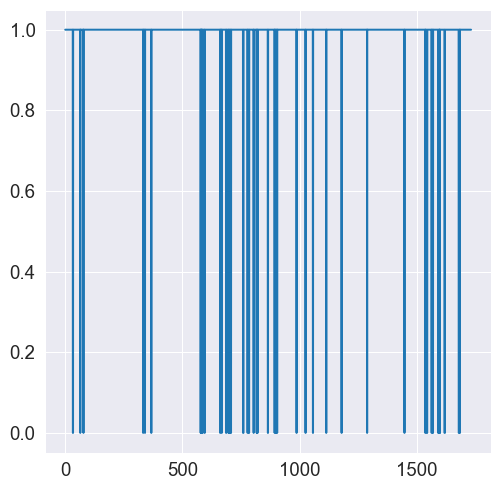

In [509]:
df_laser = pd.DataFrame(t_frame / 1000,columns=['Vol_Time'])  #激光数据
track_times = df_pos['Track_Time'].values
#要考虑是使用最近的位置和周围浓度进行判断还是使用一个volume之内的所有数据进行判断。
nearest_times = []
nearest_indices = []
for vol_time in df_laser['Vol_Time']:
    # 计算时间差的绝对值
    differences = np.abs(track_times - vol_time)
    # 找到最小差值的索引 
    nearest_idx = np.argmin(differences)
    # 保存最近时间值和索引
    nearest_times.append(track_times[nearest_idx])
    nearest_indices.append(nearest_idx)
# 将结果存入 DataFrame

df = df_pos.copy()
df.loc[:, 'X'] = -df['X']
Track_fps=int(np.mean(1/np.diff(df_pos.Track_Time.values)))
df_whole=process_trajectory(df,Track_fps,0.5,1)
foldername=os.path.basename(folder_path)    #提取数据名
file_name = f'{foldername}_dataframe_pos_pt{i+1}.csv'
df_whole.to_csv(os.path.join(folder_path, file_name), index=False)
roaming_prob=sum(df_whole['roaming'])/len(df_whole)
print(f'该数据线虫roaming比例为{roaming_prob*100:.2f}%')

df_whole= df_whole[['X', 'Y', 'Track_Time','speed','speed_smoothed','velocity_angle','agl_speed','agl_speed_smoothed','roaming']]
plt.plot(df_whole['Track_Time'], df_whole['roaming'], label='')

In [510]:
df_merged = pd.merge_asof(
    df_frame,                     # 合并到的df
    df_whole[['Track_Time','X','Y','speed','speed_smoothed','agl_speed','agl_speed_smoothed','roaming']],  # 只取需要合并的列
    left_on='Frame_time',
    right_on='Track_Time',
    direction='nearest'  
)
df_merged_choose = pd.merge_asof(
    df_choose,                     # 合并到的df
    df_whole[['Track_Time','X','Y','speed','speed_smoothed','agl_speed','agl_speed_smoothed','roaming']],  # 只取需要合并的列
    left_on='Frame_time',
    right_on='Track_Time',
    direction='nearest'  
)



# df_merged_choose['reversal'] = (df_merged_choose['angle_m'] > 120).astype(int)
df_merged_choose['quick_reversal'] = ((df_merged_choose['angle_m'] > 120) & (df_merged_choose['speed_smoothed'] >0.05)).astype(int)  #为了筛掉很慢的行为（可能不是reversal）

structure = np.ones(3)
opened_first = binary_opening(df_merged_choose['quick_reversal'].astype(bool), structure=structure).astype(int)


structure = np.ones(45)
# 先进行闭操作（膨胀后腐蚀）
closed = binary_closing(opened_first, structure=structure).astype(int)
# df_merged_choose['quick_reversal_closed'] = closed

# 再进行开操作（腐蚀后膨胀）
opened = binary_opening(closed, structure=structure).astype(int)
df_merged_choose['quick_reversal_opened'] = opened

df_merged_choose_laser = df_merged_choose.loc[id_start:id_stop].copy()
# df_merged_choose_laser['quick_reversal_point']=get_reversal_points(df_merged_choose_laser['quick_reversal'])
df_merged_choose_laser['quick_reversal_opened_point']=get_start_points(df_merged_choose_laser['quick_reversal_opened'])





In [511]:
track_time_array = df_merged_choose_laser['Track_Time'].to_numpy()  
mask = np.zeros_like(track_time_array, dtype=bool)

# 区间列表
ranges = [(333.06, 340.077), (368.148, 381.181), (397.221, 403.236), (577.675, 579.68), (581.685, 583.69), (585.695, 593.716), (621.786, 632.814), (661.887, 666.9), (682.94, 685.948), (696.976, 699.983), (728.054, 741.087), (778.18, 782.19), (784.195, 789.208), (816.276, 820.286), (865.399, 875.425), (893.47, 897.48), (904.498, 912.518), (936.578, 939.586), (977.682, 985.702), (1012.77, 1023.798), (1056.881, 1058.886), (1106.005, 1112.02), (1180.191, 1187.209), (1232.322, 1243.35), (1287.461, 1297.487), (1325.557, 1338.59), (1359.643, 1367.663), (1436.837, 1446.862), (1620.299, 1631.326)]





Con_dec_time=  [571.66, 602.74, 767.15, 891.47, 902.49, 975.68, 995.73, 1004.75, 1101.99, 1136.08, 1396.74

]






# 向量化判断每个时间点是否在任意一个区间内
for start, end in ranges:
    mask |= (track_time_array >= start) & (track_time_array <= end)

# 添加新列 label（和 df 行数一致）
df_merged_choose_laser['label'] = mask.astype(int)



In [512]:
df_merged_choose_laser 

,Frame_time,angle_m,std,Track_Time,X,Y,speed,speed_smoothed,agl_speed,agl_speed_smoothed,roaming,quick_reversal,quick_reversal_opened,quick_reversal_opened_point,label
6458,216.032,0.993579,138.330286,216.039,-48.453636,5.035995,0.051534,0.048009,16.081256,18.626638,1,0,0,0,0
6459,216.065,1.144673,137.886723,216.059,-48.452918,5.036886,0.052713,0.048378,15.002807,18.825715,1,0,0,0,0
6460,216.099,2.495055,138.822758,216.105,-48.451445,5.038768,0.055815,0.049198,12.884684,19.309218,1,0,0,0,0
6461,216.132,1.575413,140.085145,216.127,-48.450700,5.039755,0.056521,0.049620,11.835893,19.591331,1,0,0,0,0
6462,216.166,1.983976,142.342905,216.165,-48.449168,5.041850,0.058651,0.050494,9.929340,20.235354,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51163,1709.958,11.933898,103.904571,1709.959,-52.864350,20.478705,0.059895,0.072813,10.768803,33.255255,1,0,0,0,0
51164,1709.991,10.641991,104.440146,1709.985,-52.863332,20.479445,0.060174,0.073000,8.733459,33.484487,1,0,0,0,0
51165,1710.024,9.997374,103.921840,1710.031,-52.861318,20.480977,0.060883,0.073342,4.579973,33.916705,1,0,0,0,0
51166,1710.058,8.476896,103.748741,1710.057,-52.860314,20.481773,0.060832,0.073511,2.539931,34.116127,1,0,0,0,0


<function matplotlib.pyplot.show(close=None, block=None)>

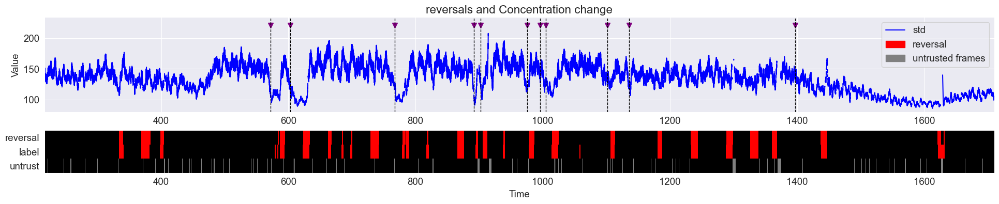

In [534]:

# fig, ax = plot_custom_timeseries(
#     df=df_merged_choose_laser,
#     time_col='Track_Time',
#     line_col='std',
#     colorbar1_col='quick_reversal_opened',     # 0/1红黑条
#     colorbar2_col='std',       # NaN灰黑条
#     # time_range=(750,900),
#     title='reversals after closed and opened'
# )
# plt.show()

os.makedirs(folder_path, exist_ok=True)

fig, ax = plot_custom_timeseries(
    df=df_merged_choose_laser,
    time_col='Track_Time',
    line_col='std',
    colorbar1_col='quick_reversal_opened',
    colorbar2_col='label',
    nanbar1_col='std',
    # time_range=(750,900),
    triangle_times=Con_dec_time,       # 指定几个时间点画三角形
    title='reversals and Concentration change'
)
plt.savefig(os.path.join(folder_path, 'reversals_and_concentration_change.png'), dpi=300, bbox_inches='tight')
plt.show

# fig, ax = plot_custom_timeseries(
#     df=df_merged_choose_laser,
#     time_col='Track_Time',
#     line_col='std',
#     colorbar1_col='label',     # 0/1红黑条
#     colorbar2_col='std',       # NaN灰黑条
#     # time_range=(750,900),
#     triangle_times=Con_dec_time,       # 指定几个时间点画三角形
#     title='reversals labeled'
# )
# plt.savefig(os.path.join(folder_path, 'reversals_labeled.png'), dpi=300, bbox_inches='tight')
# plt.show()


钙信号数据形状: (100, 4980)
[ 29  55 100]
[1185 1289 1837 2251 2288 2532 2599 2629 2953 3067 3936]


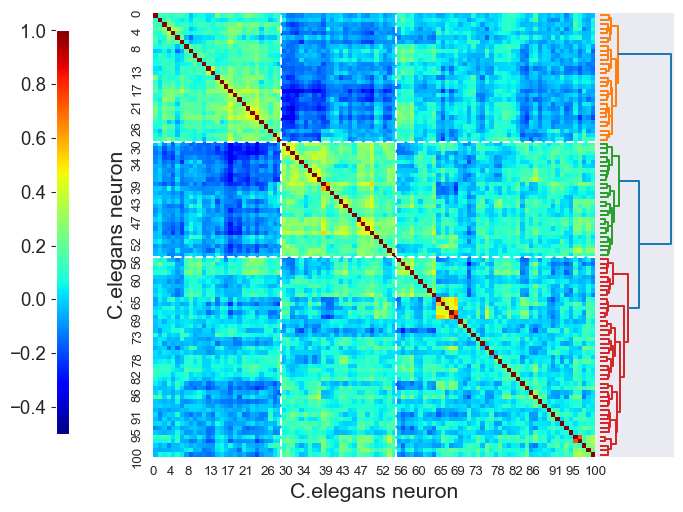

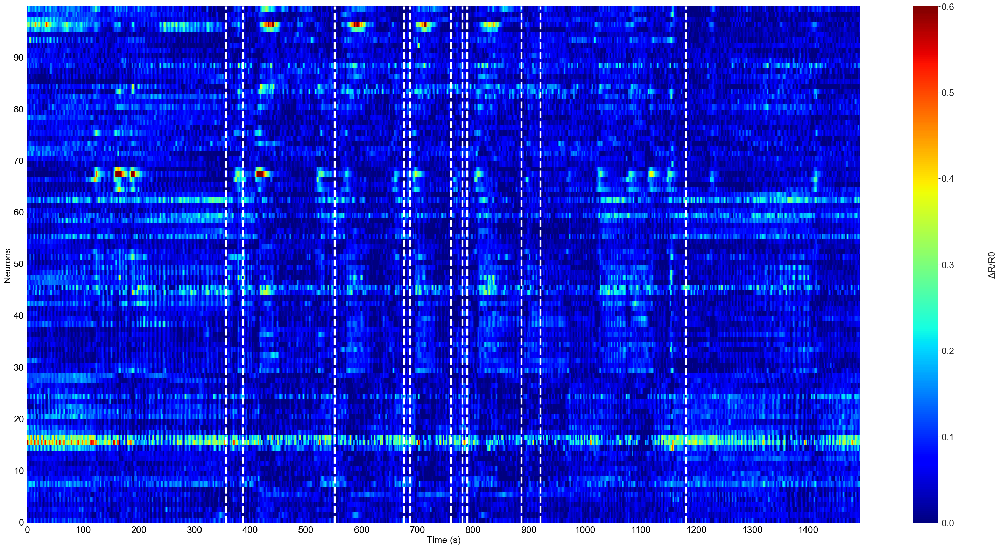

In [533]:

lyt = rf'{signal_save_path}/calcium_intensity.npy'
calcium_intensity = np.load(lyt)
print("钙信号数据形状:", calcium_intensity.shape)

# 聚类分析
choose_index = 0
thresh = 5
links = ['ward', 'average', 'average', 'complete']
affs = ['euclidean', 'cosine', 'cityblock', 'cosine']
vmin = -0.5
vmax = 1

idx = am.cluster(np.corrcoef(calcium_intensity), link=links[choose_index], aff=affs[choose_index])
bound = np.cumsum(am.GetBound(np.corrcoef(calcium_intensity), link=links[choose_index], aff=affs[choose_index], threshold=thresh).astype(int))
print(bound)
Bound_m1, fig = PlotPmdCluster(np.corrcoef(calcium_intensity), idx, idx, bound, bound, links[choose_index], affs[choose_index], vmin, vmax, thresh, 'C.elegans neuron', 'C.elegans neuron', 'jet', 35)
plt.savefig(f'{signal_save_path}/cluster_of_corrcoef_of_neurons.png')

# # 绘制曲线图
# # bound = np.cumsum(bound)
# calcium_intensity = calcium_intensity[idx]
# fig_h = int(10 * round(calcium_intensity.shape[0] / 10))
# fig_w = int(0.7 * round(calcium_intensity.shape[1] / 100))
# draw_calcium_curve(calcium_intensity, smooth_kernel=None, fig_size=(fig_w, fig_h), scale=1.5)

# 绘制热图
font_size = 20
fig_w = 40
fig_h = 20


vol_times = np.loadtxt(os.path.join(signal_save_path, 'volume_t2.txt'), delimiter=',')


# 提取 Vol_Time 数组
# 找到每个 Con_dec_time 最近的 Vol_Time 的 index
nearest_indices_con_dec = [np.abs(vol_times - t).argmin() for t in Con_dec_time]
nearest_indices_con_dec = np.array(nearest_indices_con_dec)

print(nearest_indices_con_dec)

calcium_intensity = calcium_intensity[idx]
neuron_ids = np.arange(calcium_intensity.shape[0])
calcium_heatmap(calcium_intensity, neuron_ids=neuron_ids, show_id_stride=10, show_vol_stride=100, heatmap_range=(0, 0.6), font_size=font_size, smooth_kernel=10, fig_size=(fig_w, fig_h),vlines=nearest_indices_con_dec)



In [516]:
reversal_time_str = ', '.join(map(str, df_merged_choose_laser.loc[
    df_merged_choose_laser['quick_reversal_opened_point'] == 1, 
    'Track_Time'
].dropna().tolist()))
reversal_time_str = [float(x.strip()) for x in reversal_time_str.split(',')]
nearest_indices_rev = [np.abs(vol_times - t).argmin() for t in reversal_time_str]
nearest_indices_rev = np.array(nearest_indices_rev)

In [570]:
from matplotlib import pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import numpy as np
import pandas as pd

def eta_analysis_for_std(df, signal_col, time_col, event_times,
                         pre_time=5.0, post_time=10.0,
                         cmap='jet', unify_yaxis=True, title='ETA: std signal',
                         save_path=None):
    """
    事件对齐分析 + 热图 + 平均曲线，支持美观布局。
    """
    df = df.sort_values(by=time_col).reset_index(drop=True)
    time_array = df[time_col].values
    signal_array = df[signal_col].values

    # 时间窗口帧数
    dt = np.median(np.diff(time_array))
    pre_frame = int(pre_time / dt)
    post_frame = int(post_time / dt)
    total_len = pre_frame + post_frame + 1
    time_axis = np.round(np.arange(-pre_frame, post_frame + 1) * dt, 2)

    aligned_traces = []

    for evt_time in event_times:
        idx = np.argmin(np.abs(time_array - evt_time))
        start = idx - pre_frame
        end = idx + post_frame + 1
        if start >= 0 and end <= len(df):
            trace = signal_array[start:end]
            aligned_traces.append(trace)

    if not aligned_traces:
        print("没有找到可用的事件窗口")
        return

    aligned_array = np.array(aligned_traces)
    mean_trace = np.nanmean(aligned_array, axis=0)
    sem_trace = np.nanstd(aligned_array, axis=0) / np.sqrt(aligned_array.shape[0])  # 标准误差
    # y 轴范围
    if unify_yaxis:
        ymin, ymax = np.nanmin(aligned_array), np.nanmax(aligned_array)
    else:
        ymin = ymax = None

    # 统一布局
    fig = plt.figure(figsize=(5, 10))
    gs = gridspec.GridSpec(nrows=2, ncols=7, height_ratios=[6, 4],
                           width_ratios=[1, 1, 1, 1, 1, 1, 0.2],
                           hspace=0.2)

    # 热图
    ax_h = fig.add_subplot(gs[0, 0:6])
    ax_cb = fig.add_subplot(gs[0, 6])
    sns.heatmap(aligned_array, cmap=cmap, ax=ax_h, cbar=True, cbar_ax=ax_cb,
                xticklabels=False, yticklabels=False)
    ax_h.axvline(pre_frame, color='red', linestyle='--')
    ax_h.set_ylabel("Events")
    # xticks = np.linspace(0, total_len - 1, 7).astype(int)
    # xtick_lbls = np.round(np.linspace(-pre_time, post_time, 7), 1)
    # ax_h.set_xticks(xticks)
    # ax_h.set_xticklabels(xtick_lbls)

    # 均值曲线 + SEM 阴影
    ax_m = fig.add_subplot(gs[1, 0:6])
    ax_m.set_facecolor("white")  # 设置背景为白色
    ax_m.plot(time_axis, mean_trace, label='Mean Trace', color='black')
    ax_m.fill_between(time_axis,
                      mean_trace - sem_trace,
                      mean_trace + sem_trace,
                      color='gray', alpha=0.3, label='±1 SEM')
    ax_m.axvline(0, color='red', linestyle='--')
    ax_m.set_xlim(time_axis[~np.isnan(mean_trace)].min(), time_axis[~np.isnan(mean_trace)].max())

    if ymin is not None and ymax is not None:
        ax_m.set_ylim(ymin, ymax)

    ax_m.set_ylabel(signal_col)
    ax_m.set_xlabel("Time (s)")
    ax_m.set_title("Mean activity")
    ax_m.legend()


    # 保存或展示
    if save_path is not None:
        plt.savefig(os.path.join(save_path,title), dpi=150)
    plt.show()


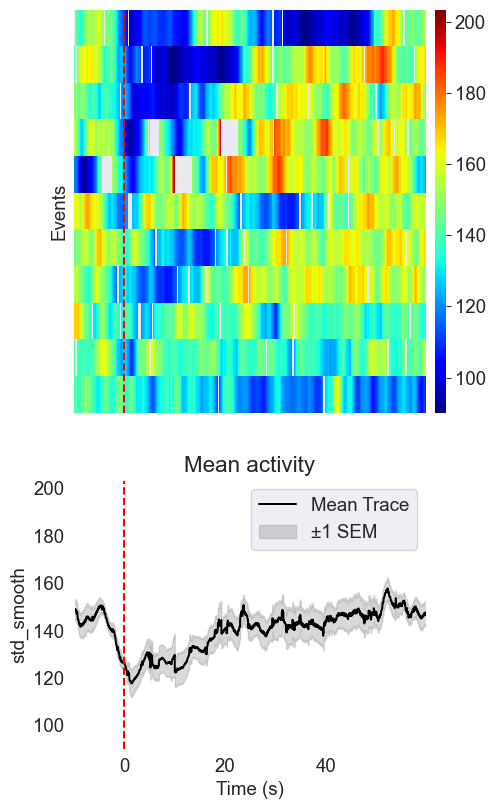

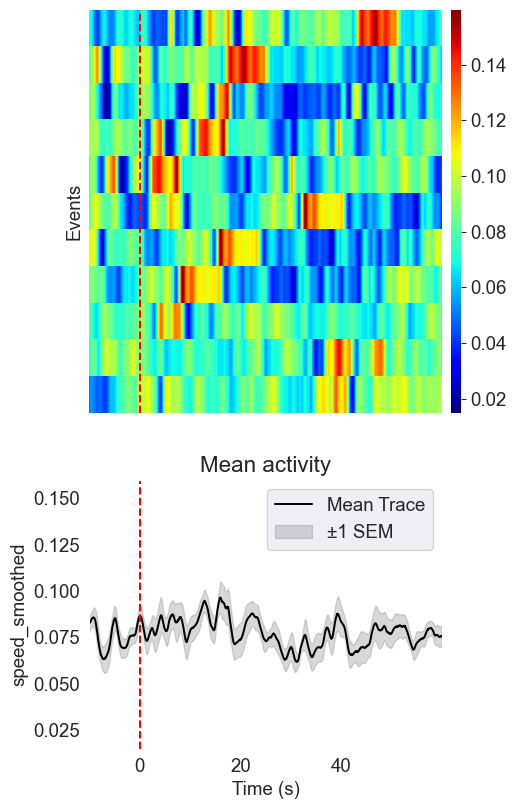

In [572]:

selected_neurons = list(range(65,70)) + list(range(94,97)) 
calcium_df = pd.DataFrame(calcium_intensity)

df_frame_smo=df_merged_choose_laser.copy()
df_frame_smo['std_smooth'] = df_frame_smo['std'].copy().rolling(window=15, center=True, min_periods=5).mean()

# plot_event_aligned_traces_combined(
#     calcium_df,
#     event_indices=nearest_indices_rev,
#     selected_neurons=selected_neurons,
#     pre_window=34,
#     post_window=200,
#     frame_interval=0.3,
#     save_path=signal_save_path,
#     event='reversals'
# )
# plot_event_aligned_traces_combined(
#     calcium_df,
#     event_indices=nearest_indices_con_dec,
#     selected_neurons=selected_neurons,
#     pre_window=34,
#     post_window=200,
#     frame_interval=0.3,
#     save_path=signal_save_path,
#     event='Con_dec'
# )


eta_analysis_for_std(
    df=df_frame_smo,
    signal_col='std_smooth',
    time_col='Track_Time',
    event_times=Con_dec_time,
    pre_time=10,     # 前 6 秒
    post_time=60,   # 后 20 秒
    unify_yaxis=True,
    save_path=signal_save_path,
    title='STD around Con dec'
)
eta_analysis_for_std(
    df=df_frame_smo,
    signal_col='speed_smoothed',
    time_col='Track_Time',
    event_times=Con_dec_time,
    pre_time=10,     # 前 6 秒
    post_time=60,   # 后 20 秒
    unify_yaxis=True,
    save_path=signal_save_path,
    title='speed around Con dec'
)


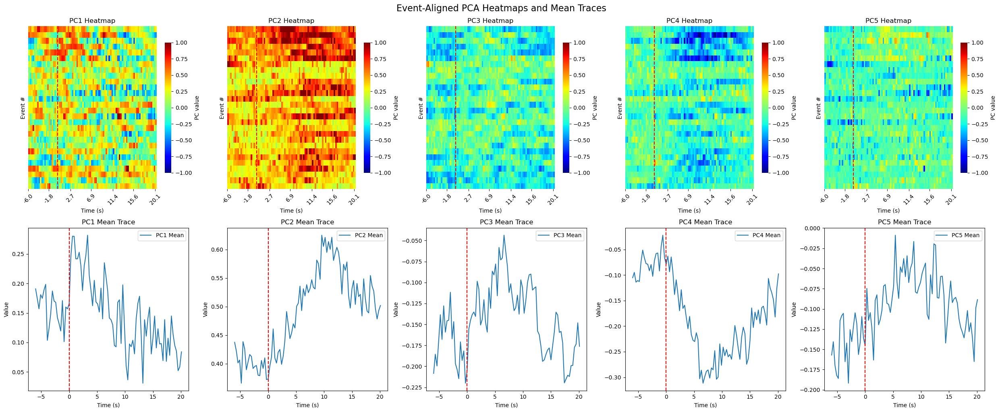

In [433]:
def plot_event_aligned_pca(df, event_col, 
                           pre_time, post_time,PC_range=5, pcs_prefix='PC', frame_interval=0.3):
    """
    根据事件点对齐绘制 PCA 成分的热图和平均曲线
    
    参数：
    - df: 包含数据的 DataFrame，需包含事件列和 PCA 列
    - event_col: 事件标志列名
    - pcs_prefix: PCA 列名前缀，默认 'PCA_'，会提取 PCA_1 至 PCA_5
    - pre_rows: 事件前提取的行数
    - post_rows: 事件后提取的行数
    - frame_interval: 每帧时间间隔（秒）
    """
    pcs = [f'{pcs_prefix}{i+1}' for i in range(PC_range)]

    # 找出所有事件索引
    event_indices = df.index[df[event_col] == 1].tolist()
    pre_rows = int(round(pre_time / frame_interval))
    post_rows = int(round(post_time / frame_interval))
    heat_data = {pc: [] for pc in pcs}

    for idx in event_indices:
        start = idx - pre_rows
        end = idx + post_rows + 1
        if start >= 0 and end <= len(df):
            segment = df.loc[start:end-1, pcs].values
            for i, pc in enumerate(pcs):
                heat_data[pc].append(segment[:, i])

    # 转为 numpy 数组，shape: time x event
    for pc in pcs:
        heat_data[pc] = np.array(heat_data[pc]).T

    time_axis = np.round(np.arange(-pre_rows, post_rows + 1) * frame_interval, 1)
    xtick_positions = np.linspace(0, len(time_axis)-1, 7).astype(int)
    xtick_labels = time_axis[xtick_positions]

    fig, axes = plt.subplots(2, 5, figsize=(25, 10))
    axes = axes.flatten()

    for i, pc in enumerate(pcs):
        ax_heat = axes[i]
        ax_avg = axes[i + 5]

        # 画热图
        sns.heatmap(
            heat_data[pc].T,
            ax=ax_heat,
            cmap='jet',
            cbar=True,
            vmin=-1,  # 或根据你数据实际情况设定，比如 min/max(mean ± std)
            vmax=1,
            cbar_kws={'label': 'PC value', 'shrink': 0.8, 'aspect': 20},
            xticklabels=False,
            yticklabels=False
        )
        ax_heat.set_title(f"{pc} Heatmap")
        ax_heat.set_xlabel("Time (s)")
        ax_heat.set_ylabel("Event #")
        ax_heat.axvline(pre_rows, color='red', linestyle='--')
        ax_heat.set_xticks(xtick_positions)
        ax_heat.set_xticklabels(xtick_labels, rotation=45)

        # 画平均曲线
        mean_trace = heat_data[pc].mean(axis=1)
        ax_avg.plot(time_axis, mean_trace, label=f'{pc} Mean')
        ax_avg.axvline(0, color='red', linestyle='--')
        ax_avg.set_title(f"{pc} Mean Trace")
        ax_avg.set_xlabel("Time (s)")
        ax_avg.set_ylabel("Value")
        ax_avg.legend()

    plt.tight_layout()
    plt.suptitle("Event-Aligned PCA Heatmaps and Mean Traces", y=1.02, fontsize=16)
    plt.show()
    
plot_event_aligned_pca(df_nt_merged,'quick_reversal_points',6,20)

In [ ]:
"""
浓度变化测试代码，先跳过
"""

from scipy.signal import savgol_filter



df=df_merged_choose_laser.copy()
# method1:
df['std_below_100'] = (df['std_smooth'] < 125).astype(int)
closed = binary_closing(df['std_below_100'].values, structure=np.ones(30))
opened = binary_opening(closed, structure=np.ones(30))
df['std_below_100_cleaned'] = opened.astype(int)

# method2:一秒内std值均值减少量是原来的20%
window_size = 60  # 10 个点为 1 秒
rolling_mean = df['std_smooth'].rolling(window=window_size, min_periods=1).mean()
    # 当前值和前1秒前的值比较，是否下降超过20%
rolling_max_before = df['std_smooth'].rolling(window=window_size, min_periods=1).max().shift(window_size)
ratio_drop_max = (rolling_max_before - df['std_smooth']) / (rolling_max_before + 1e-6)
df['method2_flag'] = (ratio_drop_max > 0.2).astype(int)

# method3: 一阶导后求绝对值
df['abs_std_gradient'] = abs(np.gradient(df['std_smooth'].values))

# method4: 稳定下降1s
diff_std = df['std_smooth'].diff()

# 滑动窗口判断每个1秒内是否都在下降（允许1-2个小异常）
window_size = 30
decline_count = diff_std.rolling(window=window_size).apply(lambda x: np.sum(x < 0), raw=True)
df['method4_flag'] = (decline_count >= 25).astype(int)  # 至少8个点在下降

fig, ax = plot_custom_timeseries(
    df=df_merged_choose_laser,
    time_col='Track_Time',
    line_col='std',
    line_color_by_col='quick_reversal_opened',
    # colorbar1_col='quick_reversal_opened',
    colorbar2_col='std',
    # time_range=(750,900),
    triangle_times=Con_dec_time,       # 指定几个时间点画三角形
    title='reversals and Concentration change'
)
plt.show

plt.figure(figsize=(25, 4))
plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std_smooth'], label='smoothed std', color='orange')
plt.legend()
plt.xlabel('Time')
plt.ylabel('std')
plt.title('Raw vs Smoothed')
plt.show()

plt.figure(figsize=(25, 4))
plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
plt.plot(df['Track_Time'], df['std_below_100_cleaned']*100, label='smoothed std', color='orange')
plt.legend()
plt.xlabel('Time')
plt.ylabel('std')
plt.title('method1')
plt.show()

plt.figure(figsize=(25, 4))
plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
plt.plot(df['Track_Time'], df['method2_flag']*100, label='std diff', alpha=0.5)
plt.legend()
plt.xlabel('Time')
plt.ylabel('std')
plt.title('method2')
plt.show()

# plt.figure(figsize=(25, 4))
# # plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
# plt.plot(df['Track_Time'], df['abs_std_gradient'], label='std diff', alpha=0.5)
# plt.legend()
# plt.xlabel('Time')
# plt.ylabel('std')
# plt.title('method3')
# plt.show()

# plt.figure(figsize=(25, 4))
# plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
# plt.plot(df['Track_Time'], df['method4_flag']*100, label='std diff', alpha=0.5)
# plt.legend()
# plt.xlabel('Time')
# plt.ylabel('std')
# plt.title('method4')
# plt.show()

df['method1+2'] = ((df['std_below_100_cleaned'] == 1) & (df['method2_flag'] == 1)).astype(int)

plt.figure(figsize=(25, 4))
plt.plot(df_merged_choose_laser['Track_Time'], df_merged_choose_laser['std'], label='raw std', alpha=0.5)
plt.plot(df['Track_Time'], df['method1+2']*100, label='std diff', alpha=0.5)
plt.legend()
plt.xlabel('Time')
plt.ylabel('std')
plt.title('method1+2')
plt.show()

fig, ax = plot_custom_timeseries(
    df=df,
    time_col='Track_Time',
    line_col='std',
    # colorbar1_col='quick_reversal_opened',
    # colorbar2_col='std',
    # time_range=(750,900),
    vertical_line_col='method1+2',
    triangle_times=Con_dec_time,       # 指定几个时间点画三角形
    title='reversals and Concentration change'
)
plt.show


In [ ]:
closed = binary_closing(df['method1+2'].values, structure=np.ones(60))
df_merged_choose_laser['con_dec']=closed.astype(int)


df_nt_merged= pd.merge_asof(
    df_laser,                     # 合并到的df
    df_merged_choose_laser[['Frame_time','speed','speed_smoothed','agl_speed','agl_speed_smoothed','roaming','angle_m','std','quick_reversal_opened','con_dec']],  # 只取需要合并的列
    left_on='Vol_Time',
    right_on='Frame_time',
    direction='nearest'  
)
df_nt_merged['quick_reversal_points']=get_start_points(df_nt_merged['quick_reversal_opened'])
df_nt_merged['con_dec_points']=get_start_points(df_nt_merged['con_dec'])
reversal_point=df_nt_merged.loc[df_nt_merged['quick_reversal_points'] == 1, 'Frame_time']
con_dec_point=df_nt_merged.loc[df_nt_merged['con_dec_points'] == 1, 'Frame_time']

df_nt_merged = pd.concat([df_nt_merged, Cal_PCA.iloc[:, :15]], axis=1)

In [ ]:
#  #获取真实位置信息
# """
#     目前没有用到
# """
# # 载物台标校角度
# 4/ 500
# # 载物台像素标定
# l = 0.33 * 0.84  # um/pixel
# # 完成时间对齐
# t_p_t = []
# for t in t_p:
#     t_p_t.append(t_c[np.searchsorted(t_c, t) - 1])
# # 计算真实咽喉位置
# x_t = []
# y_t = []
# for t in t_p_t:
#     i = np.searchsorted(t_stage, t)
#     if i == 0:
#         t_p_t.remove(t)
#         x_p = x_p[1:]
#         y_p = y_p[1:]
#     if i == len(t_stage):
#         t_p_t.remove(t)
#         x_p = x_p[:-1]
#         y_p = y_p[:-1]
#         continue
#     t_0 = t_stage[i-1]
#     t_1 = t_stage[i]
#     x_t.append((x_stage[i] - x_stage[i-1]) / (t_1 - t_0) * (t - t_0) + x_stage[i-1]) 
#     y_t.append((y_stage[i] - y_stage[i-1]) / (t_1 - t_0) * (t - t_0) + y_stage[i-1])
# x_p_new = gaussian_filter1d(x_p, sigma = 2)
# y_p_new = gaussian_filter1d(y_p, sigma = 2)
# x_new = x_t - (x_p_new-128) * l * 4
# y_new = y_t - (y_p_new-128) * l * 4
# 
# t_p_t = np.array(t_p_t)
# stage_idxs = []
# for i in data_keys:
#     stage_idxs.append(np.searchsorted(t_p_t, t_c[i]))
# stage_idxs = np.array(stage_idxs)
# x_s = x_new[stage_idxs]
# y_s = y_new[stage_idxs]